# House Plant Species Classification 🌿

**Exploring and Classifying House Plants Using ResNet50**

# Importing Libraries

In [1]:
# Standard / utility
import os

# Data science
import numpy as np
import pandas as pd

# Visualization (import matplotlib.pyplot as plt when needed)
import matplotlib.pyplot as plt
import seaborn as sns

# Image handling
from PIL import Image

# ML / Deep learning (prefer tensorflow.keras over standalone keras)
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models, optimizers, callbacks
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import to_categorical

# Pretrained models (import specific models you will use)
from tensorflow.keras.applications import ResNet50, EfficientNetB0

# Sklearn utilities
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix



In [2]:
import tensorflow as tf

# --- List available physical devices ---
gpus = tf.config.list_physical_devices('GPU')
print("Available GPUs:", gpus)

# --- Check if TensorFlow is using GPU ---
if tf.test.gpu_device_name():
    print("✅ GPU is being used by TensorFlow:", tf.test.gpu_device_name())
else:
    print("❌ No GPU detected. TensorFlow is using CPU.")

# --- Extra: Get detailed log info ---
from tensorflow.python.client import device_lib
print("\nAll devices detected by TensorFlow:")
print(device_lib.list_local_devices())


Available GPUs: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
✅ GPU is being used by TensorFlow: /device:GPU:0

All devices detected by TensorFlow:
[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 10477134736538273352
xla_global_id: -1
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 5711593472
locality {
  bus_id: 1
  links {
  }
}
incarnation: 2811221476921376017
physical_device_desc: "device: 0, name: NVIDIA GeForce RTX 4060 Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.9"
xla_global_id: 416903419
]


# Reading Data

In [3]:
species = os.listdir("C:\SWAYAMs\PROJ\Plant_CNN\DATA")

In [4]:
species

['Aloe Vera',
 'Areca Palm (Dypsis lutescens)',
 'Chinese evergreen (Aglaonema)',
 'English Ivy (Hedera helix)',
 'Jade plant (Crassula ovata)',
 'Money Tree (Pachira aquatica)',
 'Parlor Palm (Chamaedorea elegans)',
 'Rubber Plant (Ficus elastica)',
 'Snake plant (Sanseviera)',
 'ZZ Plant (Zamioculcas zamiifolia)']

In [5]:
species_images = {}
for specie in species:
    species_images[specie] = os.listdir(f"C:\SWAYAMs\PROJ\Plant_CNN\DATA\{specie}")

In [6]:
for specie in species_images:
    print(f"Dataset contains {len(species_images[specie])} images of {specie}")

Dataset contains 252 images of Aloe Vera
Dataset contains 189 images of Areca Palm (Dypsis lutescens)
Dataset contains 514 images of Chinese evergreen (Aglaonema)
Dataset contains 240 images of English Ivy (Hedera helix)
Dataset contains 353 images of Jade plant (Crassula ovata)
Dataset contains 359 images of Money Tree (Pachira aquatica)
Dataset contains 329 images of Parlor Palm (Chamaedorea elegans)
Dataset contains 291 images of Rubber Plant (Ficus elastica)
Dataset contains 396 images of Snake plant (Sanseviera)
Dataset contains 438 images of ZZ Plant (Zamioculcas zamiifolia)


In [7]:
df = pd.DataFrame({"species": [k for k,li in species_images.items() for image in li], "image": [image for k,li in species_images.items() for image in li]})

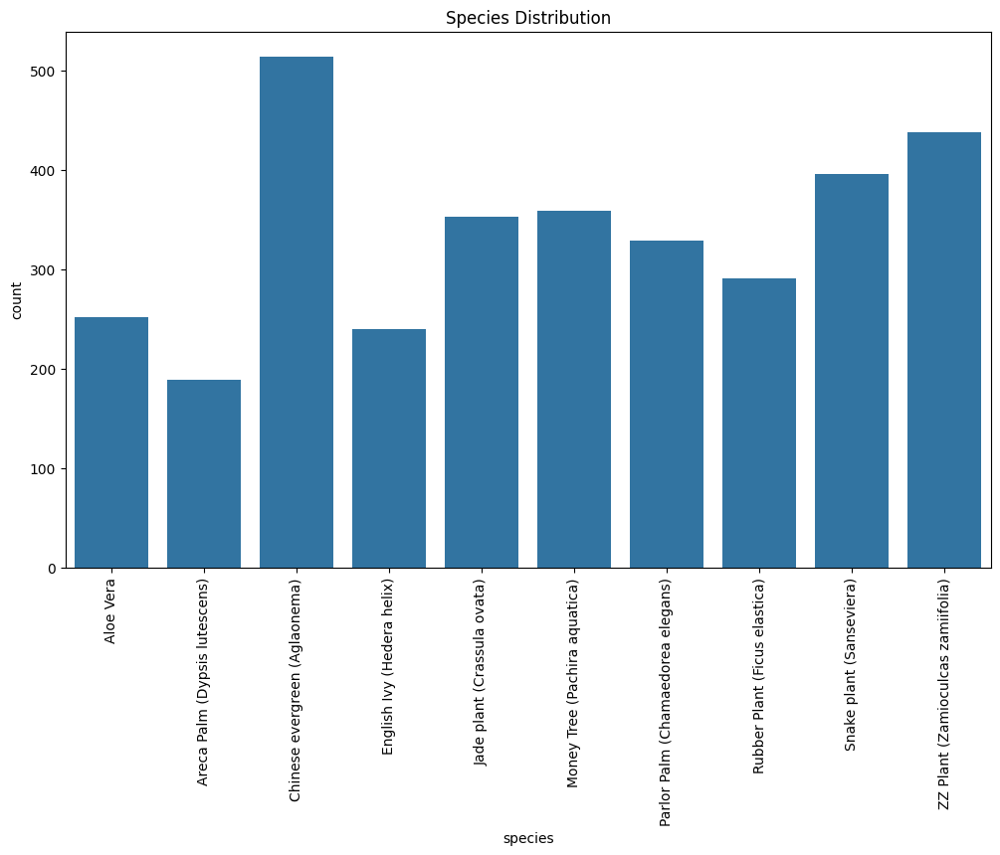

In [8]:
plt.figure(figsize=(12,7))
sns.countplot(df, x='species')
plt.xticks(rotation=90)
plt.title("Species Distribution")
plt.show()

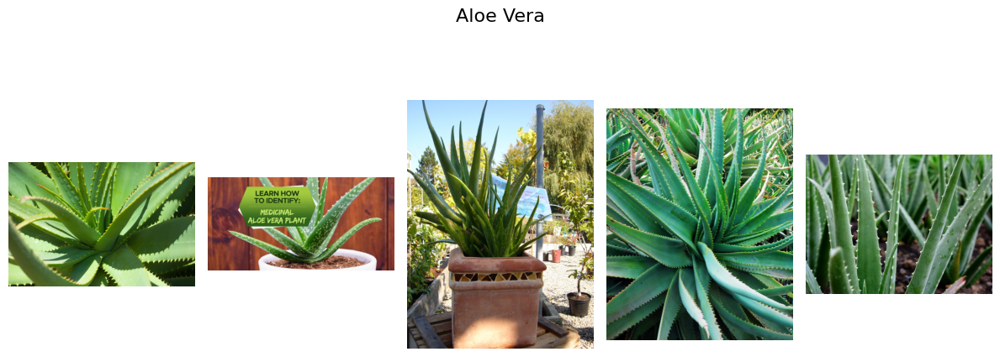

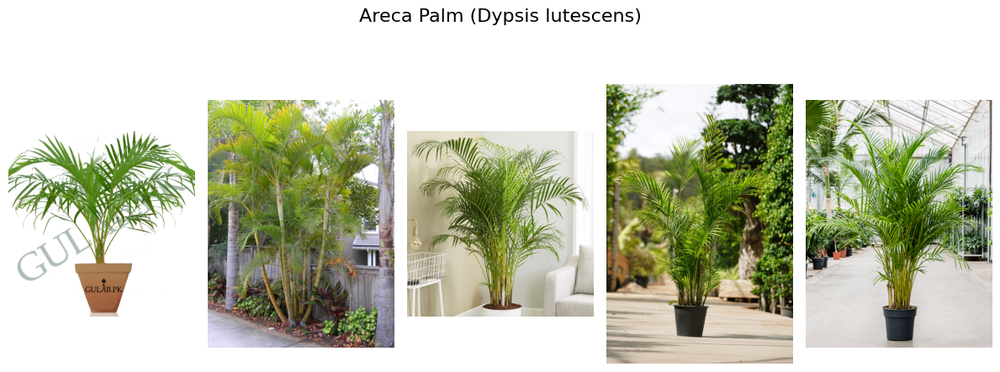

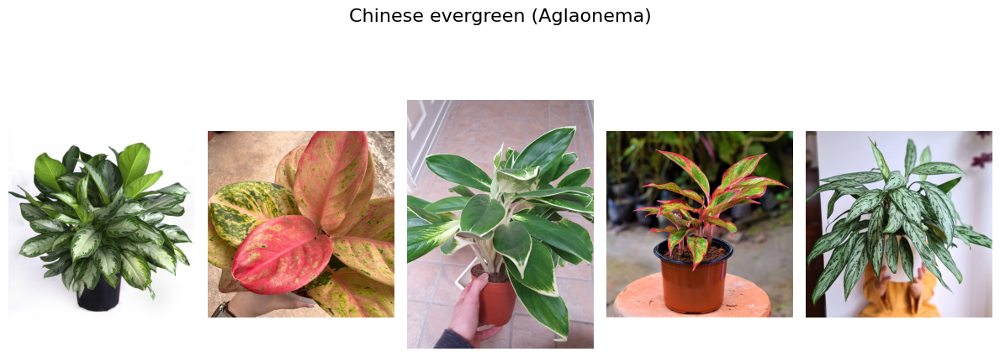

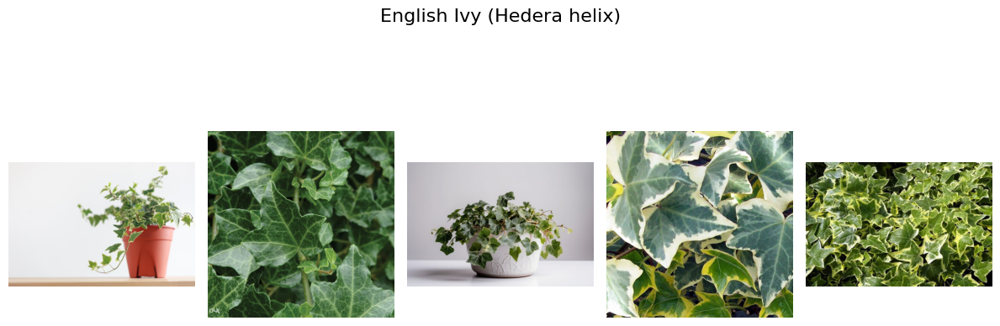

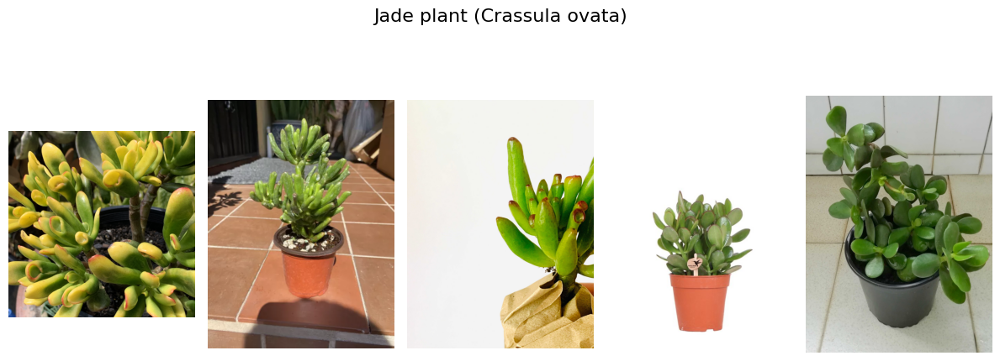

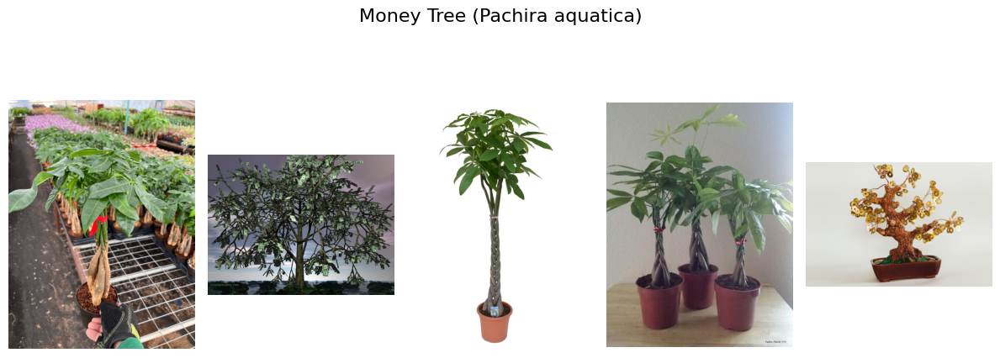

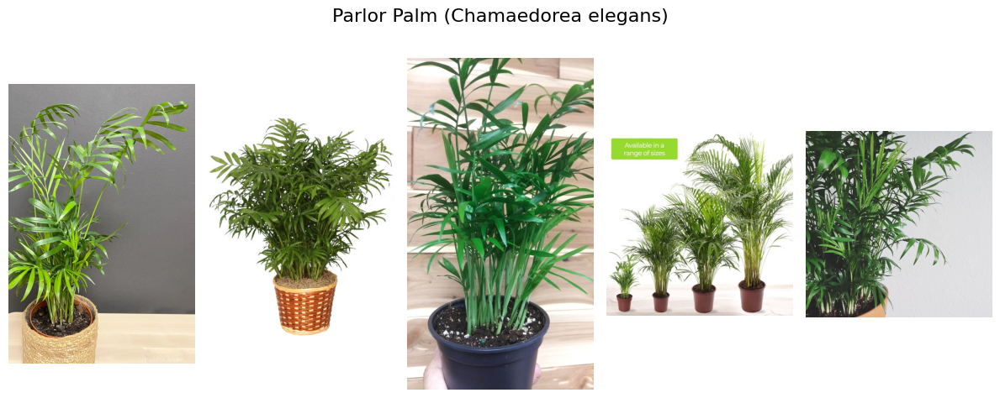

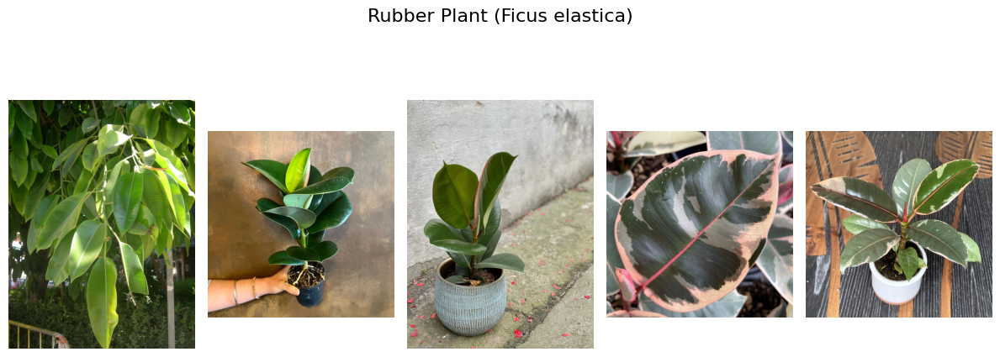

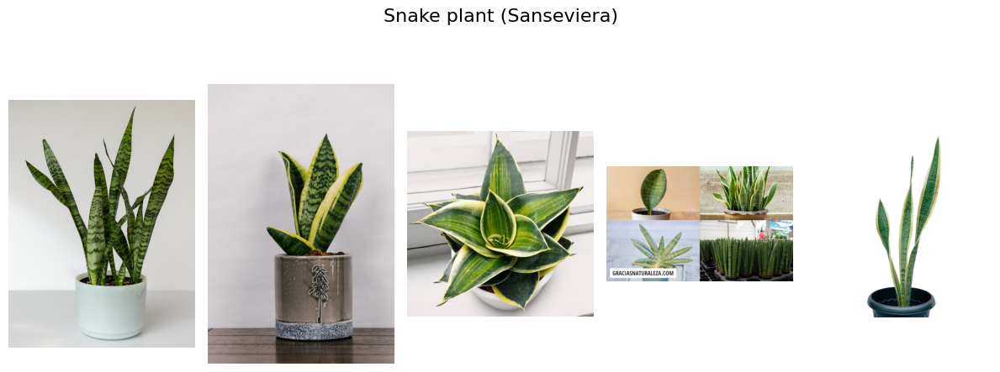

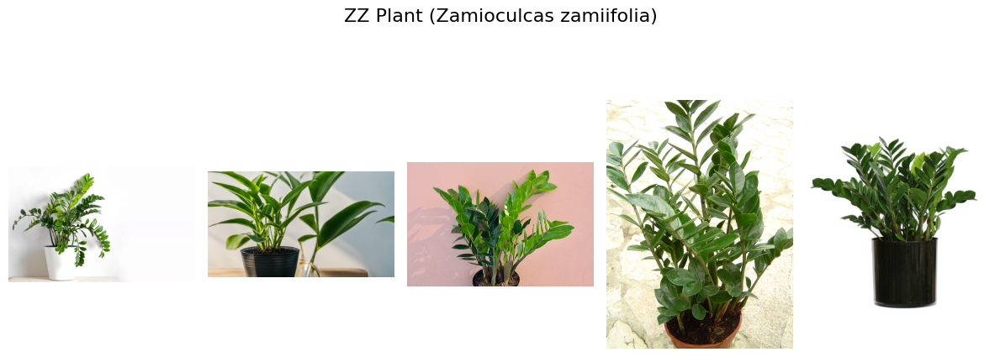

In [9]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image


for specie in species_images:
    total_len = len(species_images[specie])
    random_nos = np.random.randint(0, total_len, 5)
    

    fig, axes = plt.subplots(1, 5, figsize=(12, 5))
    fig.suptitle(f"{specie}", fontsize=16)
    

    for i, no in enumerate(random_nos):
        image_name = species_images[specie][no]
        image = Image.open(f"C:\SWAYAMs\PROJ\Plant_CNN\DATA\{specie}/{image_name}")
        axes[i].imshow(image)
        axes[i].axis('off')
    
    plt.tight_layout()
    plt.show()


# Building Image Generator, Preprocessing and Augmentation

In [10]:
def create_image_path(row):
    species = row['species']
    image_name = row['image']
    path = "C:\SWAYAMs\PROJ\Plant_CNN\DATA"
    return path + "/" + species + "/" + image_name

df["image_path"] = df.apply(create_image_path, axis=1)

In [11]:
# Shuffle the dataframe
df = df.sample(frac=1).reset_index(drop=True)

In [12]:
# Perform a train-test split, stratified by the species column
train_df, val_df = train_test_split(
    df,
    test_size=0.2,         # 20% validation set
    stratify=df['species'], # Stratify based on species to maintain the distribution
    random_state=42         # For reproducibility
)

In [13]:
# Parameters
image_size = (224, 224)
batch_size = 32

In [14]:
# ImageDataGenerator for training with augmentation
train_datagen = ImageDataGenerator(
    rescale=1.0/255.0,   # Rescale pixel values
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
)

# ImageDataGenerator for validation without augmentation
val_datagen = ImageDataGenerator(
    rescale=1.0/255.0,  # Only rescale for validation
)

# Create the train dataset (with augmentations)
train_generator = train_datagen.flow_from_dataframe(
    train_df,
    x_col='image_path',
    y_col='species',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    seed=42
)

# Create the validation dataset (without augmentations)
val_generator = val_datagen.flow_from_dataframe(
    val_df,
    x_col='image_path',
    y_col='species',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    seed=42,
    shuffle = False
)

Found 2664 validated image filenames belonging to 10 classes.
Found 662 validated image filenames belonging to 10 classes.


c:\Python39\lib\site-packages\keras\preprocessing\image.py:1139: UserWarning: Found 24 invalid image filename(s) in x_col="image_path". These filename(s) will be ignored.
  warnings.warn(
c:\Python39\lib\site-packages\keras\preprocessing\image.py:1139: UserWarning: Found 11 invalid image filename(s) in x_col="image_path". These filename(s) will be ignored.
  warnings.warn(


In [15]:
print(train_generator.class_indices)

{'Aloe Vera': 0, 'Areca Palm (Dypsis lutescens)': 1, 'Chinese evergreen (Aglaonema)': 2, 'English Ivy (Hedera helix)': 3, 'Jade plant (Crassula ovata)': 4, 'Money Tree (Pachira aquatica)': 5, 'Parlor Palm (Chamaedorea elegans)': 6, 'Rubber Plant (Ficus elastica)': 7, 'Snake plant (Sanseviera)': 8, 'ZZ Plant (Zamioculcas zamiifolia)': 9}


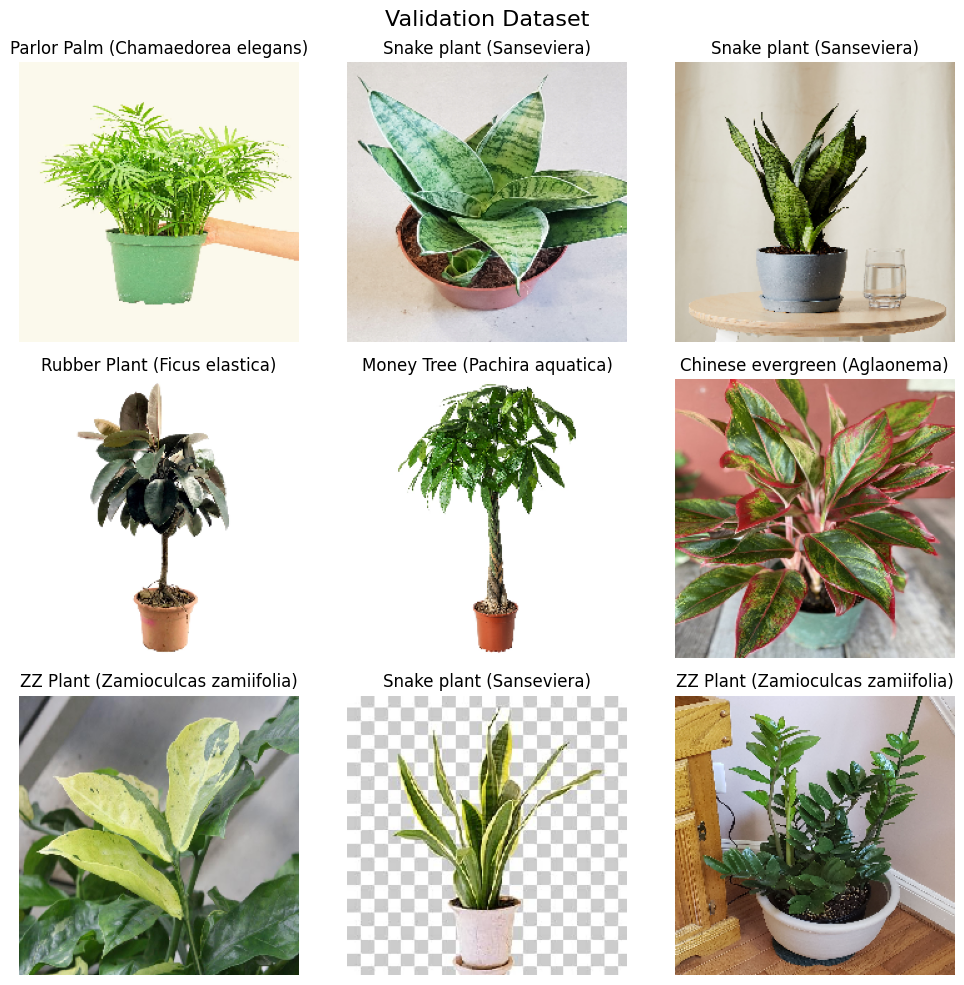

c:\Python39\lib\site-packages\PIL\Image.py:981: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


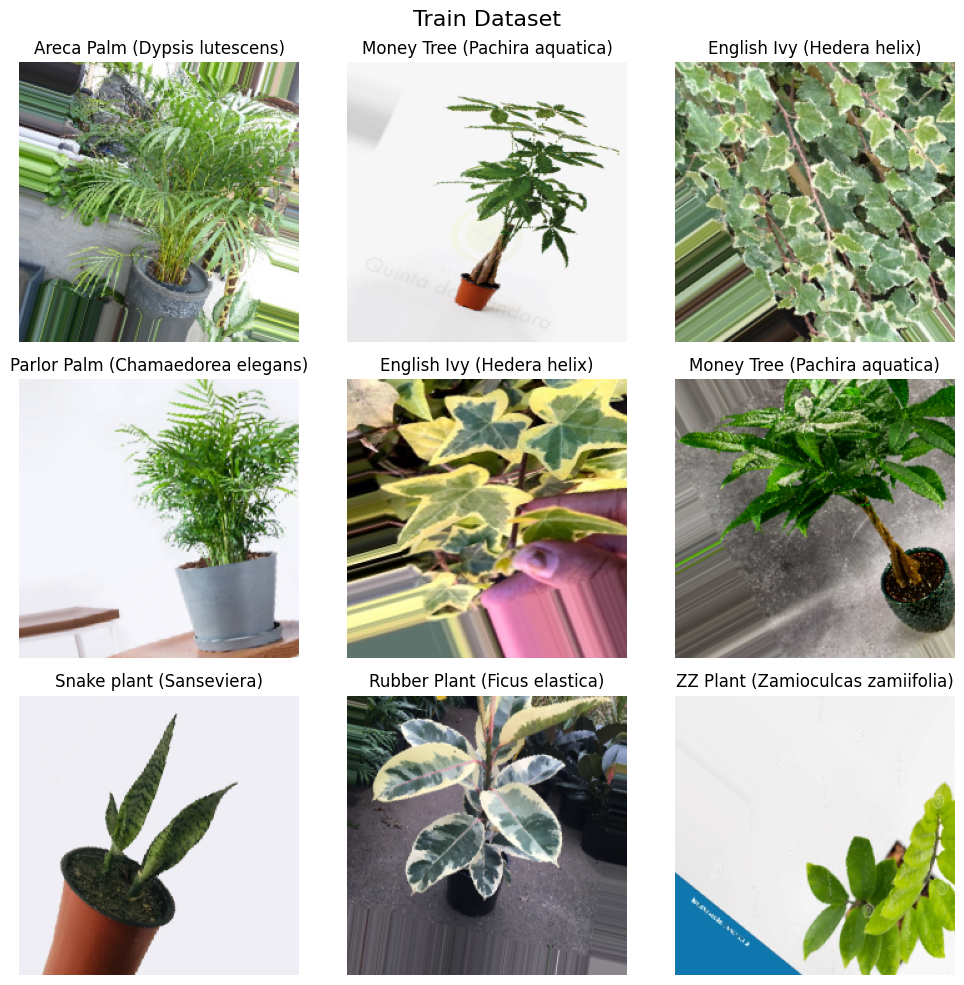

In [16]:
def visualize_augmented_images(generator, suptitle):
    # Get a batch of images from the generator
    images, labels = next(generator)
    label_map = list(generator.class_indices.keys())

    # Create a 3x3 grid to display images
    plt.figure(figsize=(10, 10))
    plt.suptitle(suptitle, fontsize=16)
    for i in range(9):
        plt.subplot(3, 3, i+1)
        plt.title(label_map[np.argmax(labels[i])])
        plt.imshow(images[i])
        plt.axis('off')
    plt.tight_layout()
    plt.show()

visualize_augmented_images(val_generator, "Validation Dataset")
visualize_augmented_images(train_generator, "Train Dataset")

# Building the ResNet50 Model

In [17]:
# Convoluted Base MODEL

conv_base = ResNet50(weights='imagenet',
include_top=False,
input_shape=(224, 224, 3))

In [18]:
# Freeze the base model layers so they are not trainable
# for layer in conv_base.layers:
#     layer.trainable = False

# headModel = conv_base.output
# headModel = AveragePooling2D(pool_size=(7, 7))(headModel)
# headModel = Flatten(name="flatten")(headModel)
# headModel = Dense(256, activation="relu")(headModel)
# headModel = Dropout(0.5)(headModel)
# headModel = Dense(len(train_generator.class_indices), activation="softmax")(headModel)

# model = Model(inputs=conv_base.input, outputs=headModel)

# model.compile(optimizer=Adam(learning_rate=0.001),
#               loss='categorical_crossentropy',
#               metrics=['accuracy'])

from tensorflow.keras.layers import GlobalAveragePooling2D, Dense
from tensorflow.keras.models import Model

x = conv_base.output
x = GlobalAveragePooling2D()(x)  # Global Average Pooling to reduce dimensionality
x = Dense(1024, activation='relu')(x)  # Fully connected layer
predictions = Dense(len(train_generator.class_indices), activation='softmax')(x)  # Output layer for classification

# Create the complete model
model = Model(inputs=conv_base.input, outputs=predictions)
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])


In [19]:
print(model.summary())

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                              

# Model Training

In [20]:
# from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

# callbacks = [
#     EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True),  # Stop training early if val_loss does not improve
#     ModelCheckpoint(filepath='resnet_model.keras', monitor='val_loss', save_best_only=True),  # Save the best model
#     ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=3)  # Reduce learning rate when val_loss plateaus
# ]

# --- compute class weights ---
from sklearn.utils.class_weight import compute_class_weight
import numpy as np

class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train_generator.classes),
    y=train_generator.classes
)
class_weights = dict(enumerate(class_weights))
print("Class Weights:", class_weights)

# --- callbacks ---
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

callbacks = [
    EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True),
    ModelCheckpoint(filepath='resnet_model.keras', monitor='val_loss', save_best_only=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=3)
]


Class Weights: {0: 1.3386934673366835, 1: 1.7642384105960265, 2: 0.6481751824817519, 3: 1.4021052631578947, 4: 0.9617328519855596, 5: 0.9282229965156794, 6: 1.0325581395348837, 7: 1.1433476394849786, 8: 0.8511182108626199, 9: 0.7721739130434783}


In [21]:
# history = model.fit(
#     train_generator,
#     epochs=25,
#     validation_data=val_generator,
#     callbacks=callbacks,
# )

# --- training ---
history = model.fit(
    train_generator,
    epochs=25,
    validation_data=val_generator,
    callbacks=callbacks,
    class_weight=class_weights   # <---- use here
)

c:\Python39\lib\site-packages\PIL\Image.py:981: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch 1/25
84/84 [==============================] - 77s 753ms/step - loss: 2.0621 - accuracy: 0.3307 - val_loss: 14.0181 - val_accuracy: 0.1163 - lr: 0.0010
Epoch 2/25
84/84 [==============================] - 66s 785ms/step - loss: 1.2902 - accuracy: 0.5559 - val_loss: 39.9511 - val_accuracy: 0.0574 - lr: 0.0010
Epoch 3/25
84/84 [==============================] - 70s 833ms/step - loss: 0.9341 - accuracy: 0.6783 - val_loss: 2.2856 - val_accuracy: 0.1163 - lr: 0.0010
Epoch 4/25
84/84 [==============================] - 85s 1s/step - loss: 0.8921 - accuracy: 0.7027 - val_loss: 22.3683 - val_accuracy: 0.0574 - lr: 0.0010
Epoch 5/25
84/84 [==============================] - 72s 856ms/step - loss: 0.6850 - accuracy: 0.7616 - val_loss: 2.5288 - val_accuracy: 0.1133 - lr: 0.0010
Epoch 6/25
84/84 [==============================] - 73s 870ms/step - loss: 0.6802 - accuracy: 0.7710 - val_loss: 3.0799 - val_accuracy: 0.1163 - lr: 0.0010
Epoch 7/25
84/84 [==============================] - 83s 987ms/st

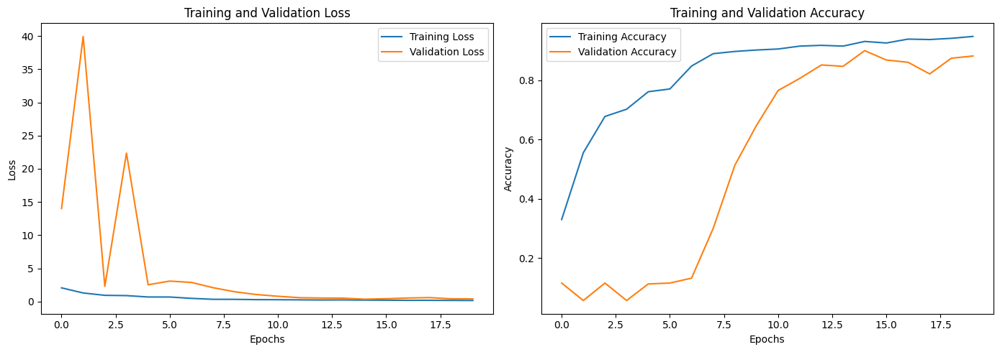

In [22]:
plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Plotting training and validation accuracy
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

# Evaluating the Model

21/21 [==============================] - 11s 472ms/step


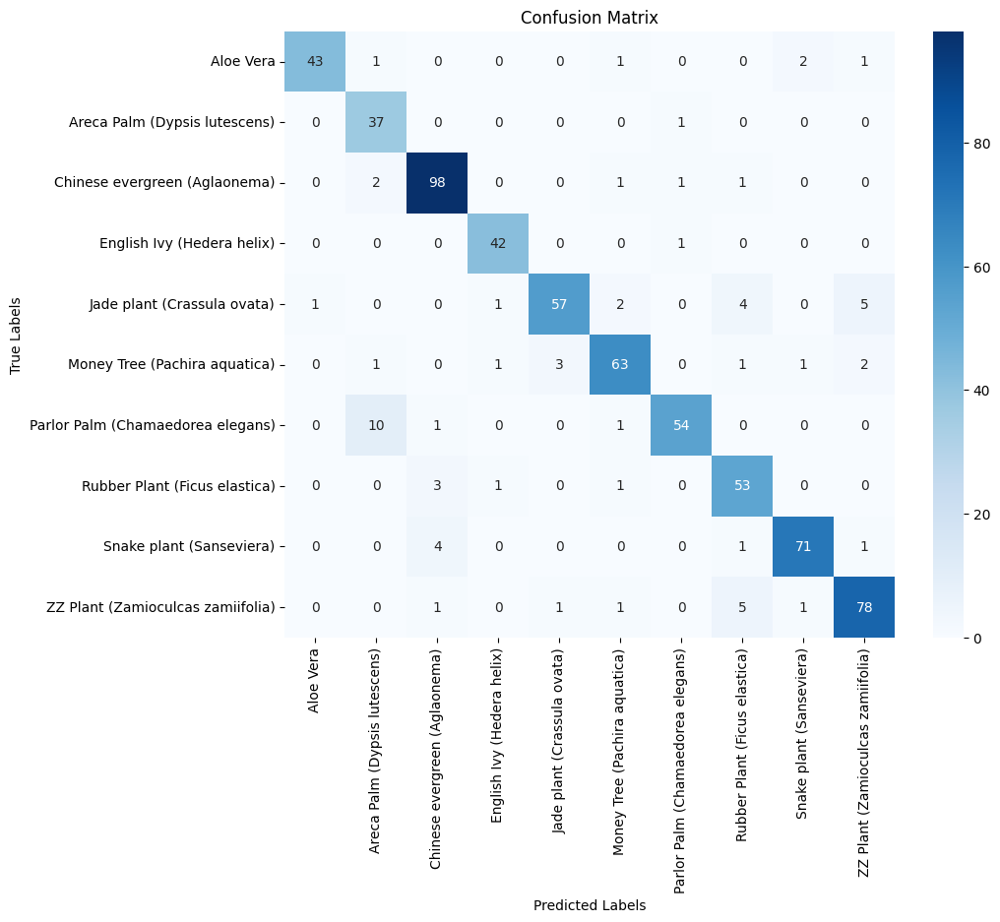

Classification Report:
                                   precision    recall  f1-score   support

                        Aloe Vera       0.98      0.90      0.93        48
    Areca Palm (Dypsis lutescens)       0.73      0.97      0.83        38
    Chinese evergreen (Aglaonema)       0.92      0.95      0.93       103
       English Ivy (Hedera helix)       0.93      0.98      0.95        43
      Jade plant (Crassula ovata)       0.93      0.81      0.87        70
    Money Tree (Pachira aquatica)       0.90      0.88      0.89        72
Parlor Palm (Chamaedorea elegans)       0.95      0.82      0.88        66
    Rubber Plant (Ficus elastica)       0.82      0.91      0.86        58
         Snake plant (Sanseviera)       0.95      0.92      0.93        77
ZZ Plant (Zamioculcas zamiifolia)       0.90      0.90      0.90        87

                         accuracy                           0.90       662
                        macro avg       0.90      0.90      0.90       662


In [23]:
# 1. Generate predictions from the model
predictions = model.predict(val_generator)
predicted_classes = np.argmax(predictions, axis=1)

# 2. Extract true labels from val_generator
true_classes = val_generator.classes  # This works if you're using ImageDataGenerator
class_labels = list(val_generator.class_indices.keys())  # Get the class labels

# 3. Confusion Matrix
conf_matrix = confusion_matrix(true_classes, predicted_classes)

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.title('Confusion Matrix')
plt.ylabel('True Labels')
plt.xlabel('Predicted Labels')
plt.show()

# 4. Classification Report
report = classification_report(true_classes, predicted_classes, target_names=class_labels)
print("Classification Report:")
print(report)

In [24]:
model.save('plant_species_Model.h5')

esnet_model_final.h5 No file or directory found at C:\SWAYAMs\PROJ\Plant_CNN


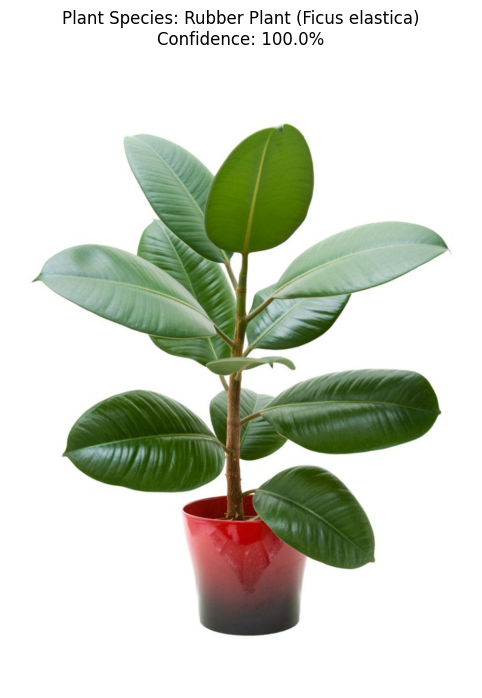


Prediction Results:
Plant Species: Rubber Plant (Ficus elastica)
Confidence: 100.0%


In [27]:
import tensorflow as tf
from keras.models import load_model
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np
from PIL import Image
import os

# Load the saved model
try:
    model = load_model("C:\SWAYAMs\PROJ\Plant_CNN\resnet_model_final.h5")
    print("Model loaded successfully!")
except Exception as e:
    print(f"Error loading model: {e}")

# Define image size
IMG_SIZE = 224

# Use the predefined class list
class_names = ["Aloe Vera", "Areca Palm (Dypsis lutescens)", "Chinese evergreen (Aglaonema)", 
               "English Ivy (Hedera helix)", "Jade plant (Crassula ovata)", "Money Tree (Pachira aquatica)", 
               "Parlor Palm (Chamaedorea elegans)", "Rubber Plant (Ficus elastica)", 
               "Snake plant (Sanseviera)", "ZZ Plant (Zamioculcas zamiifolia)"]

def predict_plant(image_path):
    """
    Make a prediction for a single image
    """
    try:
        # Load and preprocess the image
        img = load_img(image_path, target_size=(IMG_SIZE, IMG_SIZE))
        img_array = img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0)  # Create a batch
        img_array = img_array / 255.0  # Normalize the image
        
        # Make prediction
        predictions = model.predict(img_array, verbose=0)
        predicted_class_index = np.argmax(predictions[0])
        predicted_class = class_names[predicted_class_index]
        confidence = predictions[0][predicted_class_index]
        
        return predicted_class, confidence
    except Exception as e:
        print(f"Error in prediction: {e}")
        return None, None

# Get image path from user
image_path = input("Enter the path to your plant image: ")

if os.path.exists(image_path):
    predicted_class, confidence = predict_plant(image_path)
    
    if predicted_class and confidence:
        # Display the image with prediction
        plt.figure(figsize=(8, 8))
        img = Image.open(image_path)
        plt.imshow(img)
        plt.axis('off')
        plt.title(f'Plant Species: {predicted_class}\nConfidence: {confidence:.1%}', pad=20)
        plt.show()
        
        # Print prediction in console as well
        print(f"\nPrediction Results:")
        print(f"Plant Species: {predicted_class}")
        print(f"Confidence: {confidence:.1%}")
else:
    print("Error: Image file not found. Please check the path and try again.")